![](/assets/attachments/d2l-buoi-41/scratch_vs_highlevel.png)

In [2]:
from d2l import torch as d2l
import torch
from torch import nn

In [3]:
class RNNScratch(nn.Module):
    def __init__(self, num_inputs, num_hiddens, sigma=0.01):
        super().__init__()
        self.save_hyperparameters()
        # 3 tham số VIẾT TAY
        self.W_xh = nn.Parameter(
            torch.randn(num_inputs, num_hiddens) * sigma)
        self.W_hh = nn.Parameter(
            torch.randn(num_hiddens, num_hiddens) * sigma)
        self.b_h = nn.Parameter(torch.zeros(num_hiddens))

    def forward(self, inputs, state=None):
        if state is None:
            state = torch.zeros(inputs.shape[1],
                                self.num_hiddens, ...)
        outputs = []
        for X in inputs:  # Python loop qua T steps
            state = torch.tanh(
                X @ self.W_xh + state @ self.W_hh + self.b_h)
            outputs.append(state)
        return outputs, state

In [4]:
class RNN(d2l.Module):
    """
    def forward:
        - inputs: (T, batch, num_inputs)
        - H: initial hidden state -> Nếu None -> tự tạo với zeros
        - outputs: toàn bộ hidden state và state cuối cùng
    """

    def __init__(self, num_inputs, num_hiddens):
        super().__init__()
        self.save_hyperparameters()
        self.rnn = nn.RNN(num_inputs, num_hiddens)
        # tự tạo W_xh = inp * hidden , W_hh = hidden * hidden, b_h = hidden
        # nn.RNN dùng b_ih + b_hh = b_h 

    def forward(self, inputs, H=None):
        return self.rnn(inputs, H)

> [!NOTE]: Bản chất RNN vẫn là sequential (step t phụ thuộc t-1)

In [5]:
class RNNLM(d2l.RNNLMScratch):
    def init_params(self):
        self.linear = nn.LazyLinear(self.vocab_size)

    def output_layer(self, hiddens):
        return self.linear(hiddens).swapaxes(0, 1)

In [ ]:
data = d2l.TimeMachine(batch_size=1024, num_steps=35)
rnn = RNN(num_inputs=len(data.vocab), num_hiddens=32)
model = d2l.RNNLM(rnn, len(data.vocab), 1)
trainer = d2l.Trainer(max_epochs=500, num_gpus=1)
trainer.fit(model, data)

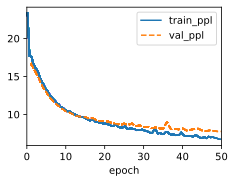

In [6]:
data = d2l.TimeMachine(batch_size=1024, num_steps=35)
rnn = RNN(num_inputs=len(data.vocab), num_hiddens=32)
model = d2l.RNNLM(rnn, len(data.vocab), 1)
trainer = d2l.Trainer(max_epochs=50, num_gpus=1)
trainer.fit(model, data)

![](/assets/attachments/d2l-buoi-41/code_comparison.png)